<a href="https://colab.research.google.com/github/josooik/DeepLearning/blob/main/2021_11_02_TeamProject.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import cv2, sys
import numpy as np
import matplotlib.pyplot as plt

from tensorflow.keras import applications
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras import utils

### 데이터 불러오기

In [3]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


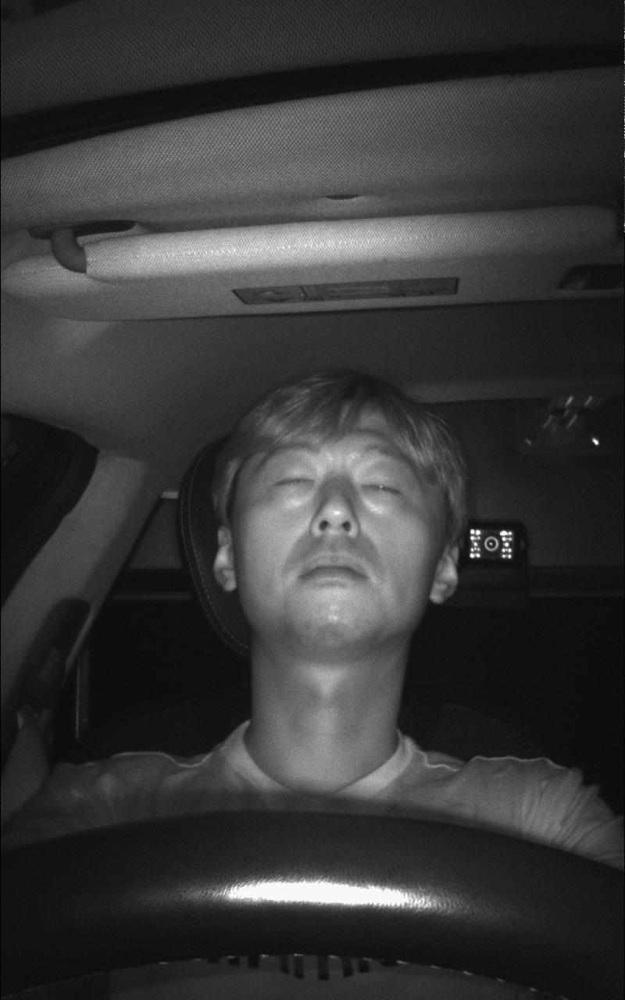

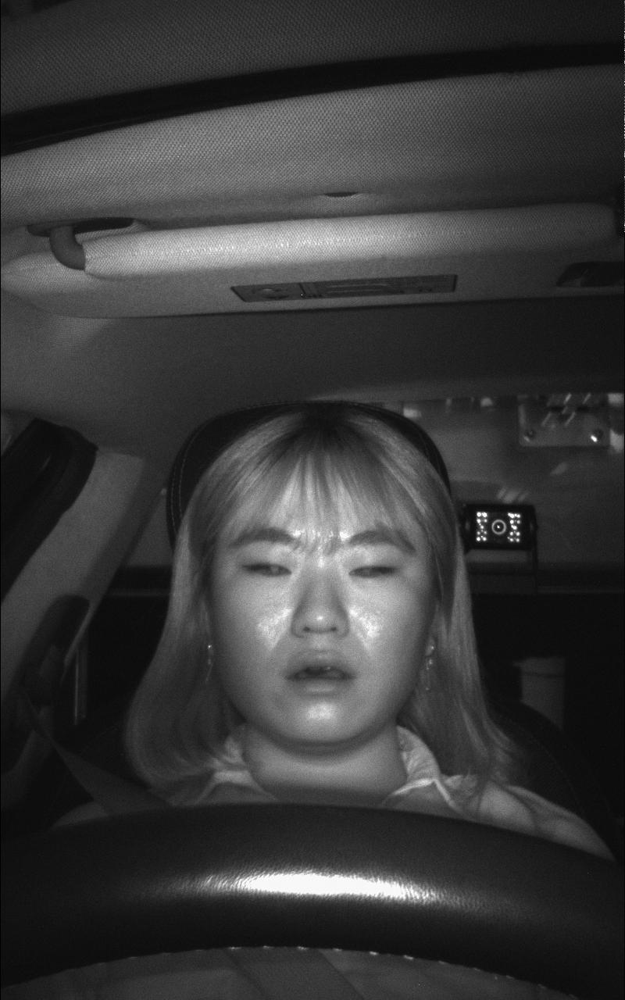

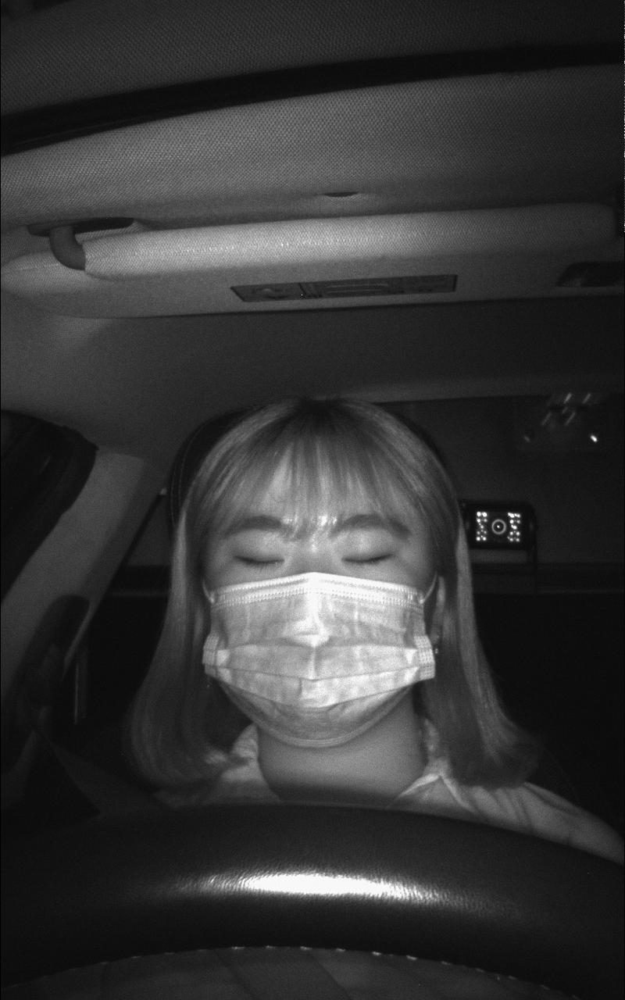

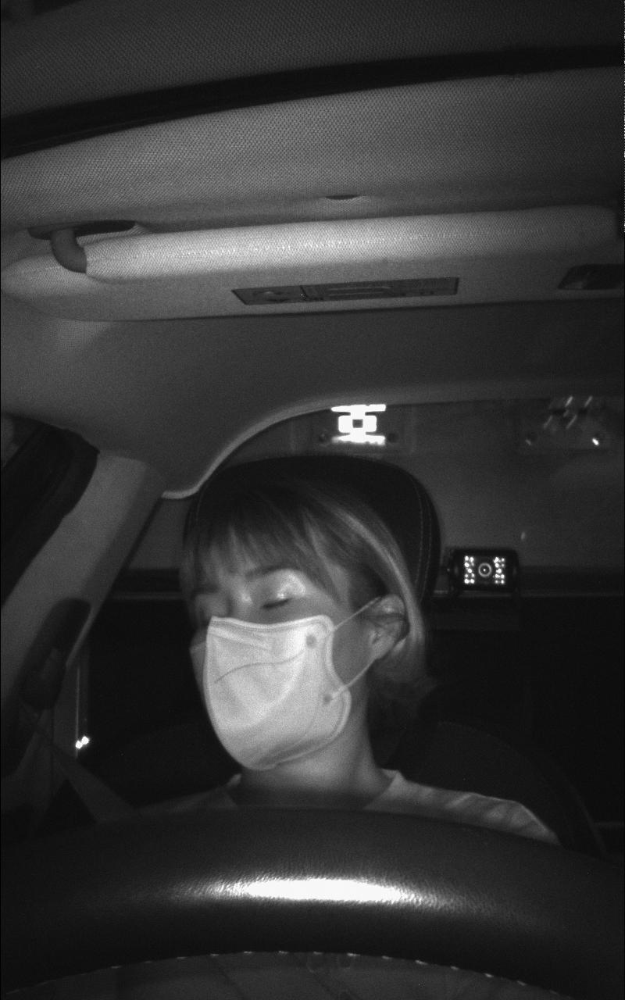

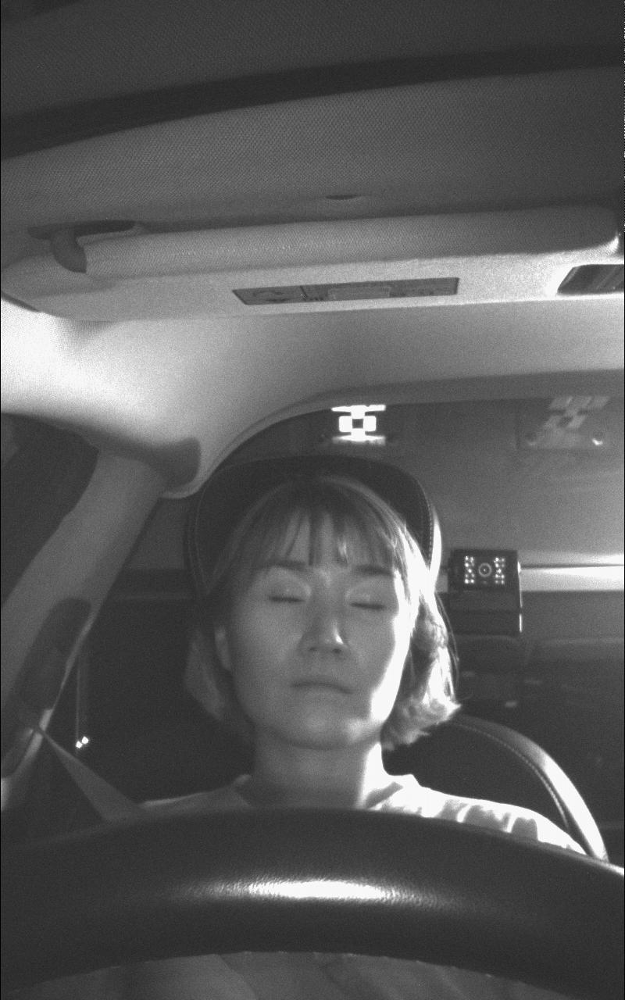

...

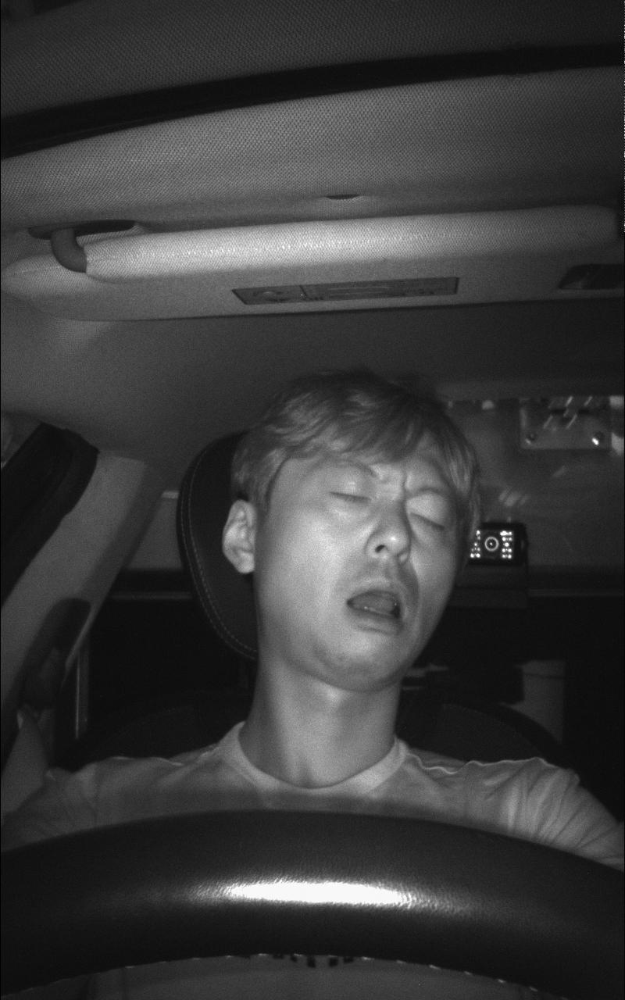

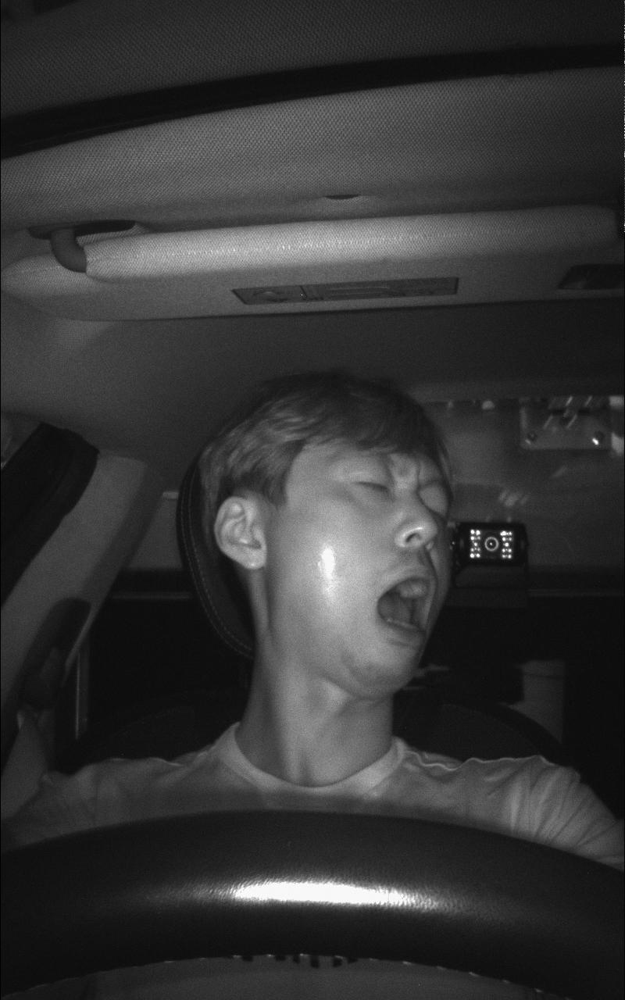

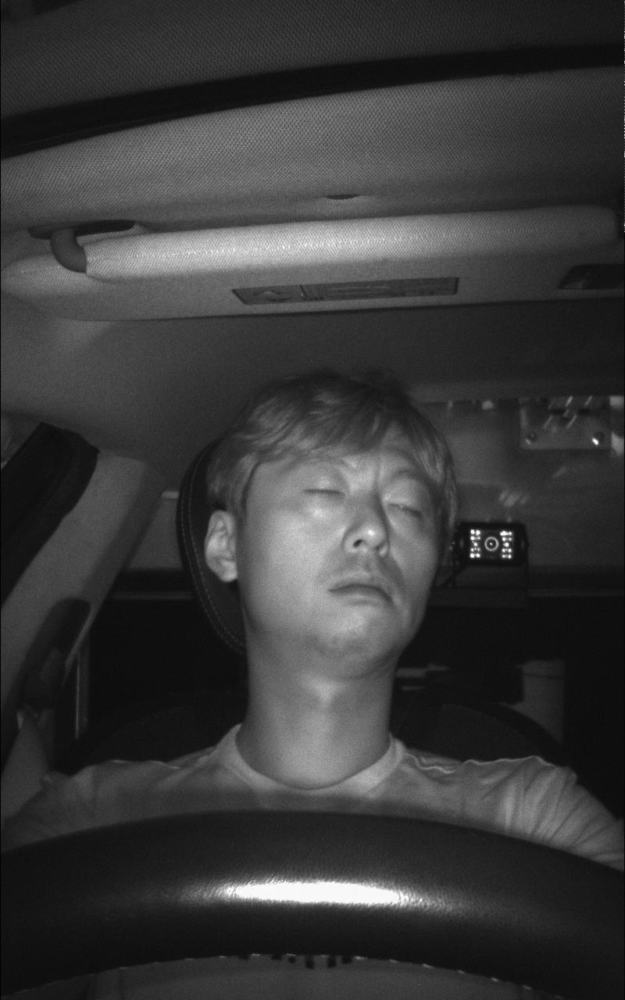

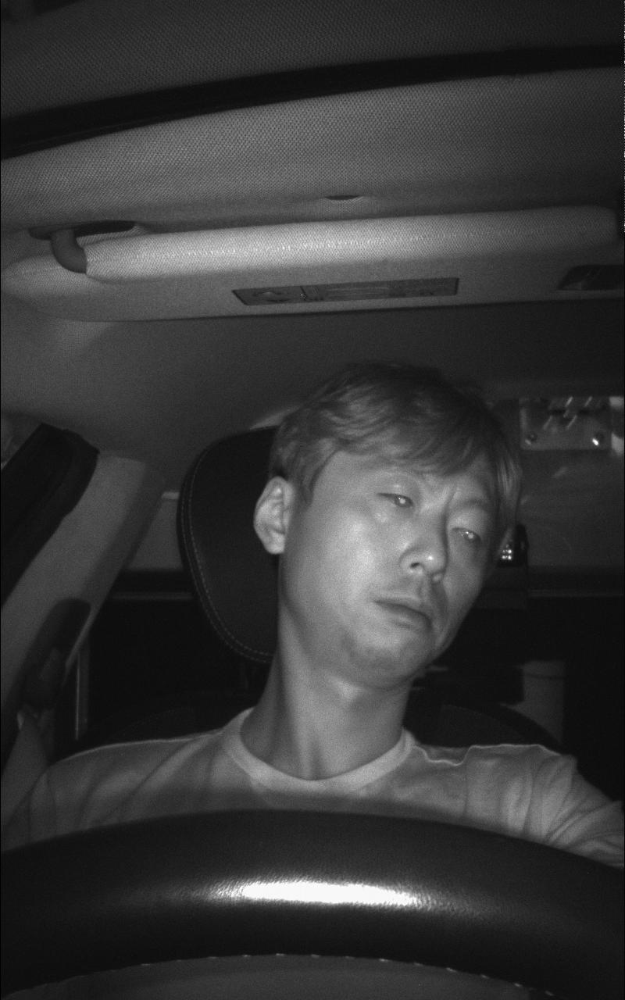

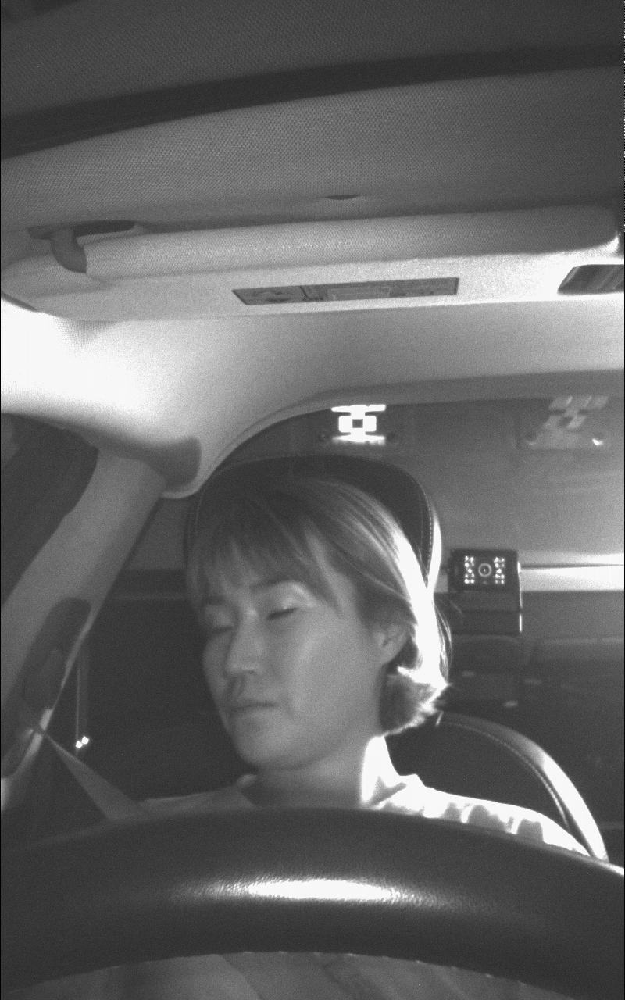

KeyboardInterrupt: ignored

In [8]:
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import os

train_dir = '/content/drive/MyDrive/딥러닝/Lecture_deeplearning_basic-main/프로젝트/dataset/train'
train_img = os.listdir(train_dir)

test_dir = '/content/drive/MyDrive/딥러닝/Lecture_deeplearning_basic-main/프로젝트/dataset/test'
test_img = os.listdir(test_dir)

for i, img_nm in enumerate(train_img):
  img_name = train_dir + '/' + train_img[i]
  img = cv2.imread(img_name, cv2.IMREAD_COLOR)
  cv2_imshow(img)


### 데이터 전처리

### 모델(VGG19) 불러오기

80150528/80134624 [==============================] - 1s 0us/step
Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32, 32, 3)]       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 32, 32, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 32, 32, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 16, 16, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 16, 16, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 16, 16, 128)       147584    
______________________________________________________________

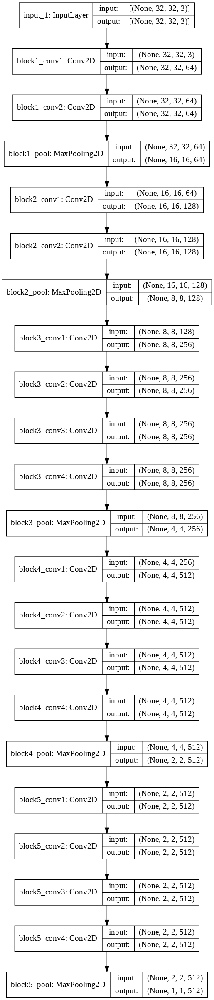

In [5]:
base_model = applications.vgg19.VGG19(weights='imagenet',
                                      include_top=False,
                                      input_shape=[32, 32, 3])

base_model.summary()
utils.plot_model(base_model, show_shapes=True)

### Detect_Flow()

In [6]:
def detect_flow(imgPath, modelDir):
    
    # read image
    img = cv2.imread(imgPath)
    (img_h, img_w) = img.shape[:2]
    print("* org img shape:", imgPath,  img.shape)
    
    # use model
    facenet = cv2.dnn.readNet(modelDir+"/deploy.prototxt",
                              modelDir+"/res10_300x300_ssd_iter_140000.caffemodel")
    
    blob = cv2.dnn.blobFromImage( img, 
                                  1.0, (300, 300),
    	                          (104.0, 177.0, 123.0))
    facenet.setInput(blob)
    detections = facenet.forward()
    print("* dections results:", detections.shape)
   
    # get results from detections
    faces=[]
    for i in range(detections.shape[2]):
      conf = detections[0,0,i,2]
      if conf <0.5:
        continue
      x1 = int(detections[0,0,i,3]*img_w)
      y1 = int(detections[0,0,i,4]*img_h)
      x2 = int(detections[0,0,i,5]*img_w)
      y2 = int(detections[0,0,i,6]*img_h)
      cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
    
      #얼굴만 크롭하기
      faces.append([x1,y1,x2,y2])
    
    # visualize
    cv2_imshow(img)
    return faces

In [7]:
img = cv2.imread(imgPath)
faces=[]
for x1, y1, x2, y2 in faces_ax:
  face= img[y1:y2,x1:x2]
  faces.append(face)

NameError: ignored

In [ ]:
for i, face in enumerate(faces):
  print(face.shape)
  plt.subplot(1,len(faces),i+1)
  plt.imshow(cv2.cvtColor(face,cv2.COLOR_BGR2RGB))
  
plt.show()

In [ ]:
from tensorflow.keras import applications, utils, layers, models, optimizers

In [ ]:
faces_pre = []

for face in faces:
  face = cv2.resize(face, (224, 224))
  face = applications.mobilenet_v2.preprocess_input(face)
  faces_pre.append(face)
  print(face.shape)

In [ ]:
for face in faces_pre:
  print(face.shape)
  plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))

plt.show()

In [ ]:
from tensorflow.keras import models

model_cfy = models.load_model("Face-detection-for-DSM/models/mask_model.h5")

In [ ]:
faces_pre = np.array(faces_pre)
faces_pre.shape

In [ ]:
results = model_cfy.predict(faces_pre)

print("faces_pre_predict = ", model_cfy.predict(faces_pre))

# Visualize

In [ ]:
face.shape

In [ ]:
img = cv2.imread(imgPath)

for i, ax in enumerate(faces_ax):
  res_1 = results[i]

  p_mask = res_1[0]
  p_without_mask = res_1[1]

  if p_mask > p_without_mask:
    color = (0,255,0)
    label = "Masked" + " : " + str(p_mask)[:4]

  else:
    color = (0, 0, 255)
    label = "Without Mask" + " : " + str(p_without_mask)[:4]

  cv2.putText(img, label, (ax[0], ax[1]-3),cv2.FONT_HERSHEY_SIMPLEX,0.6,color,2)
  cv2.rectangle(img, (ax[0], ax[1]), (ax[2], ax[3]), color, 2)

cv2_imshow(img)

print("p_mask : ", p_mask)
print("p_without_mask : ", p_without_mask)